In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## data set

https://data.mendeley.com/datasets/2mht7hz98y/1

In [2]:
from pathlib import Path

In [3]:
root=Path('data')
root.mkdir(exist_ok=True)
path= root / 'Crop_Recommendation.csv'

In [4]:
data=pd.read_csv(path)
data

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice
...,...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,coffee
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,coffee
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,coffee
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,coffee


In [5]:
data.groupby(data['label'])['label'].unique()

label
apple                [apple]
banana              [banana]
blackgram        [blackgram]
chickpea          [chickpea]
coconut            [coconut]
coffee              [coffee]
cotton              [cotton]
grapes              [grapes]
jute                  [jute]
kidneybeans    [kidneybeans]
lentil              [lentil]
maize                [maize]
mango                [mango]
mothbeans        [mothbeans]
mungbean          [mungbean]
muskmelon        [muskmelon]
orange              [orange]
papaya              [papaya]
pigeonpeas      [pigeonpeas]
pomegranate    [pomegranate]
rice                  [rice]
watermelon      [watermelon]
Name: label, dtype: object

In [6]:
data['label'].value_counts().sort_index()

label
apple          100
banana         100
blackgram      100
chickpea       100
coconut        100
coffee         100
cotton         100
grapes         100
jute           100
kidneybeans    100
lentil         100
maize          100
mango          100
mothbeans      100
mungbean       100
muskmelon      100
orange         100
papaya         100
pigeonpeas     100
pomegranate    100
rice           100
watermelon     100
Name: count, dtype: int64

In [7]:
data['label'].nunique()

22

In [8]:
data.describe()

,N,P,K,temperature,humidity,ph,rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616244,71.481779,6.469480,103.463655
std,36.917334,32.985883,50.647931,5.063749,22.263812,0.773938,54.958389
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267
25%,21.000000,28.000000,20.000000,22.769375,60.261953,5.971693,64.551686
50%,37.000000,51.000000,32.000000,25.598693,80.473146,6.425045,94.867624
75%,84.250000,68.000000,49.000000,28.561654,89.948771,6.923643,124.267508
max,140.000000,145.000000,205.000000,43.675493,99.981876,9.935091,298.560117


In [9]:
#dummys = pd.get_dummies(data['label'], drop_first=True).astype(int)
dummys = pd.get_dummies(data['label']).astype(int)
dummys

,apple,banana,blackgram,chickpea,coconut,coffee,cotton,grapes,jute,kidneybeans,...,mango,mothbeans,mungbean,muskmelon,orange,papaya,pigeonpeas,pomegranate,rice,watermelon
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2196,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2197,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2198,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
# data=data.drop(['label'],axis=1)
data = pd.concat([data, dummys], axis=1)
data

,N,P,K,temperature,humidity,ph,rainfall,label,apple,banana,...,mango,mothbeans,mungbean,muskmelon,orange,papaya,pigeonpeas,pomegranate,rice,watermelon
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice,0,0,...,0,0,0,0,0,0,0,0,1,0
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice,0,0,...,0,0,0,0,0,0,0,0,1,0
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice,0,0,...,0,0,0,0,0,0,0,0,1,0
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice,0,0,...,0,0,0,0,0,0,0,0,1,0
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507,coffee,0,0,...,0,0,0,0,0,0,0,0,0,0
2196,99,15,27,27.417112,56.636362,6.086922,127.924610,coffee,0,0,...,0,0,0,0,0,0,0,0,0,0
2197,118,33,30,24.131797,67.225123,6.362608,173.322839,coffee,0,0,...,0,0,0,0,0,0,0,0,0,0
2198,117,32,34,26.272418,52.127394,6.758793,127.175293,coffee,0,0,...,0,0,0,0,0,0,0,0,0,0


## plottings

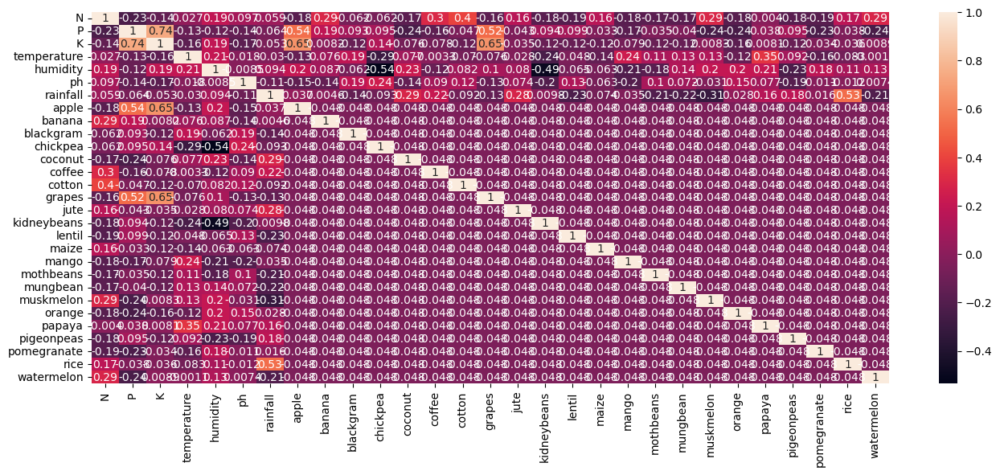

In [11]:
plt.figure(figsize=(16,6))
sns.heatmap(data.drop(['label'],axis=1).corr(),annot=True)
plt.savefig("heatmapannot.jpg", dpi=1000, bbox_inches="tight")

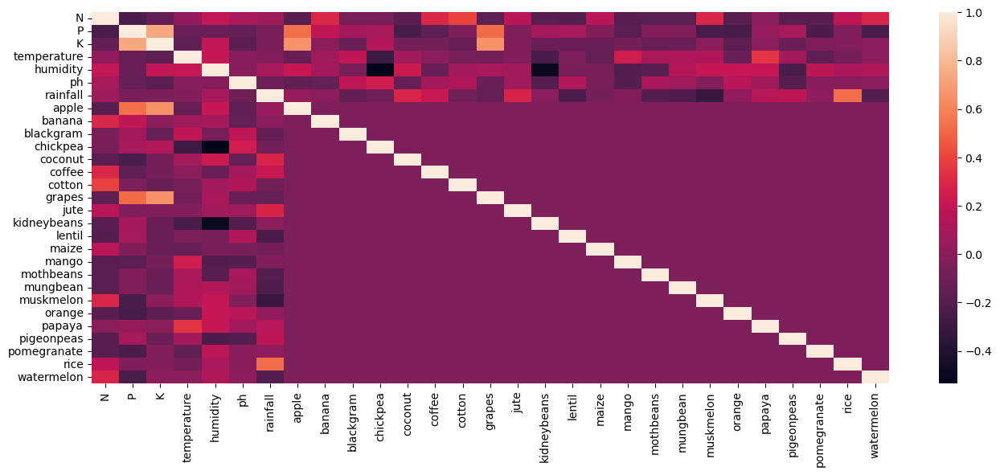

In [12]:
plt.figure(figsize=(16,6))
sns.heatmap(data.drop(['label'],axis=1).corr())
plt.savefig("heatmap.jpg", dpi=1000, bbox_inches="tight")

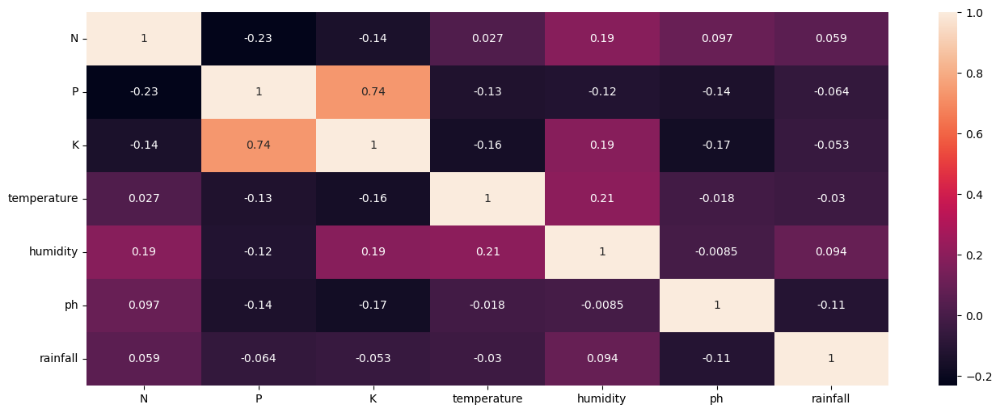

In [13]:
plt.figure(figsize=(16,6))
sns.heatmap(data[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']].corr(),annot=True)
plt.savefig("heatmapiin_features.jpg", dpi=1000, bbox_inches="tight")

In [14]:
%%time
sns.pairplot(data,hue='label')
plt.savefig("alldummiesfeatures.jpg", dpi=700, bbox_inches="tight")

MemoryError: bad allocation

CPU times: total: 31.4 s
Wall time: 27.5 s


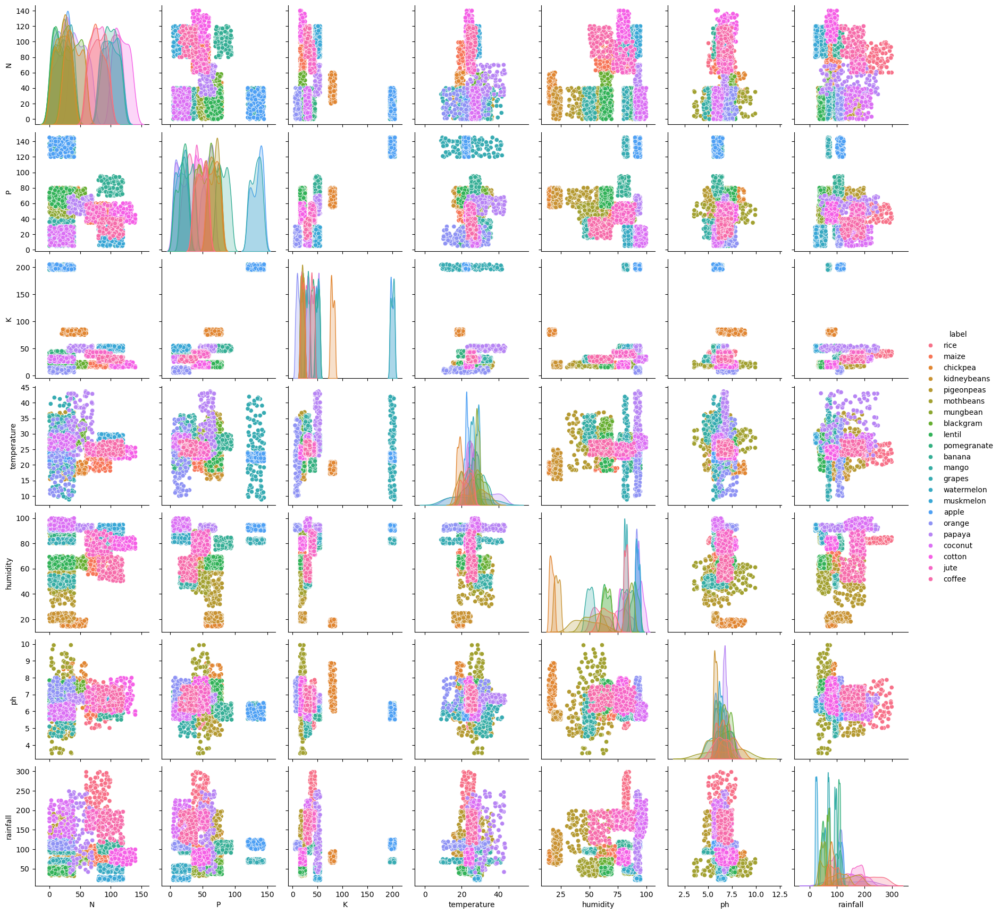

In [15]:
%%time
sns.pairplot(data[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall','label']],hue='label')
plt.savefig("selecedtfeatures.jpg", dpi=1000, bbox_inches="tight")

### creating in and out features

In [16]:
features=data[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']]
features

,N,P,K,temperature,humidity,ph,rainfall
0,90,42,43,20.879744,82.002744,6.502985,202.935536
1,85,58,41,21.770462,80.319644,7.038096,226.655537
2,60,55,44,23.004459,82.320763,7.840207,263.964248
3,74,35,40,26.491096,80.158363,6.980401,242.864034
4,78,42,42,20.130175,81.604873,7.628473,262.717340
...,...,...,...,...,...,...,...
2195,107,34,32,26.774637,66.413269,6.780064,177.774507
2196,99,15,27,27.417112,56.636362,6.086922,127.924610
2197,118,33,30,24.131797,67.225123,6.362608,173.322839
2198,117,32,34,26.272418,52.127394,6.758793,127.175293


In [17]:
target=data = data.drop(columns=['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall', 'label'])
target

,apple,banana,blackgram,chickpea,coconut,coffee,cotton,grapes,jute,kidneybeans,...,mango,mothbeans,mungbean,muskmelon,orange,papaya,pigeonpeas,pomegranate,rice,watermelon
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2196,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2197,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2198,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# model traning

In [18]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [19]:
xtrain, xtest, ytrain, ytest = train_test_split(features, target, test_size=0.2, random_state=42)

In [20]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

In [21]:
import joblib
import warnings

In [22]:
model_results = pd.DataFrame(columns=[
"Model","Train_Acc","Test_Acc",
"Train_Prec","Test_Prec",
"Train_Rec","Test_Rec",
"Train_F1","Test_F1" ])

In [23]:
def clasicalmodels(model,model_name,xtrain=xtrain,ytrain=ytrain,xtest=xtest,ytest=ytest):
    warnings.filterwarnings('ignore')
    model.fit(xtrain, ytrain)
    warnings.filterwarnings('ignore')
    ypred_train = model.predict(xtrain)
    ypred_test = model.predict(xtest)
    print(model,':')

    tr_acc = accuracy_score(ytrain, ypred_train)
    te_acc = accuracy_score(ytest, ypred_test)
    tr_p = precision_score(ytrain, ypred_train, average="weighted")
    te_p = precision_score(ytest, ypred_test, average="weighted")
    tr_r = recall_score(ytrain, ypred_train, average="weighted")
    te_r = recall_score(ytest, ypred_test, average="weighted")
    tr_f = f1_score(ytrain, ypred_train, average="weighted")
    te_f = f1_score(ytest, ypred_test, average="weighted")
    
    print(f"Train Accuracy : {tr_acc:.4f}")
    print(f"Test  Accuracy : {te_acc:.4f}")
    print(f"Train Precision: {tr_p:.4f}")
    print(f"Test  Precision: {te_p:.4f}")
    print(f"Train Recall   : {tr_r:.4f}")
    print(f"Test  Recall   : {te_r:.4f}")    
    print(f"Train F1 Score : {tr_f:.4f}")
    print(f"Test  F1 Score : {te_f:.4f}")

    model_results.loc[len(model_results)] = [model_name,tr_acc,te_acc,tr_p, te_p, tr_r, te_r, tr_f, te_f]

    fig, axes = plt.subplots(2, 1, figsize=(12, 16))
    sns.heatmap(confusion_matrix(np.argmax(ytrain, axis=1),np.argmax(ypred_train, axis=1)),annot=True,fmt='d',ax=axes[0],cmap="Blues",cbar=False )
    axes[0].set_title("Train Confusion Matrix")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("Actual")
    
    sns.heatmap(confusion_matrix(np.argmax(ytest, axis=1),np.argmax(ypred_test, axis=1)),annot=True,fmt='d',ax=axes[1],cmap="Blues",cbar=False )
    axes[1].set_title("Test Confusion Matrix")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("Actual")
    plt.show()
        
    from pathlib import Path
    root=Path("models")
    root.mkdir(exist_ok=True)
    path = root / f"{str(model.__class__.__name__)}.pkl"
    joblib.dump(model, path)

    return model
        

DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=2,
                       random_state=42) :
Train Accuracy : 0.8841
Test  Accuracy : 0.8614
Train Precision: 0.8408
Test  Precision: 0.8212
Train Recall   : 0.8841
Test  Recall   : 0.8614
Train F1 Score : 0.8532
Test  F1 Score : 0.8300


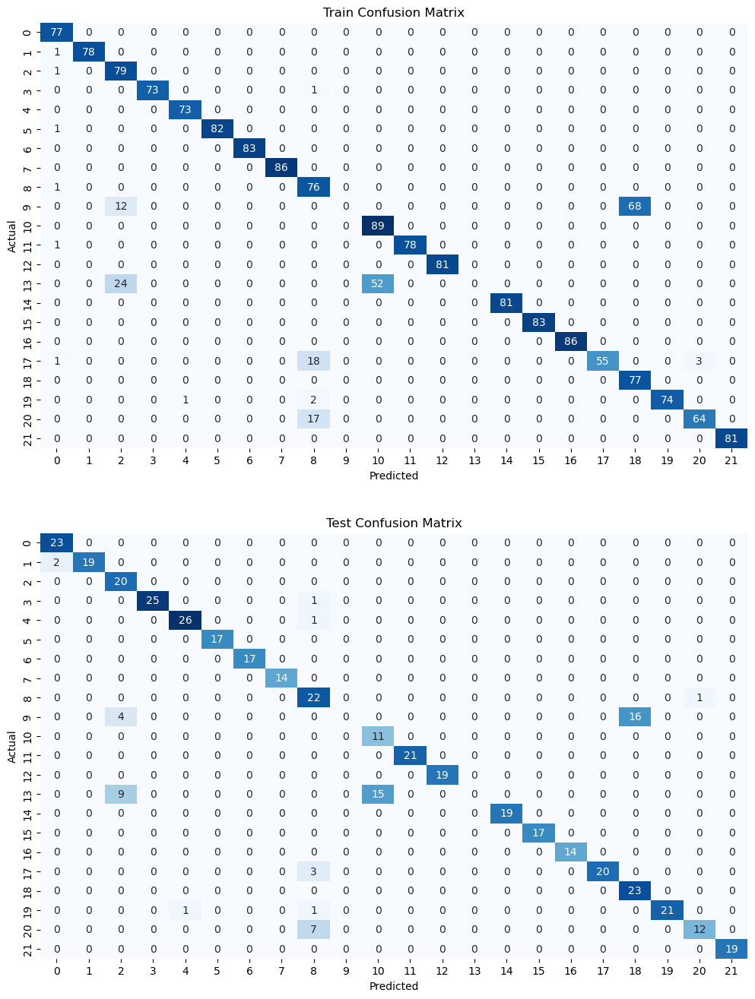

CPU times: total: 1.2 s
Wall time: 1.38 s


In [24]:
%%time
# DecisionTreeClassifier
decitree=clasicalmodels(DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=2,random_state=42),model_name='DTC')

RandomForestClassifier(n_estimators=18, random_state=86) :
Train Accuracy : 0.9994
Test  Accuracy : 0.9909
Train Precision: 1.0000
Test  Precision: 0.9958
Train Recall   : 0.9994
Test  Recall   : 0.9909
Train F1 Score : 0.9997
Test  F1 Score : 0.9931


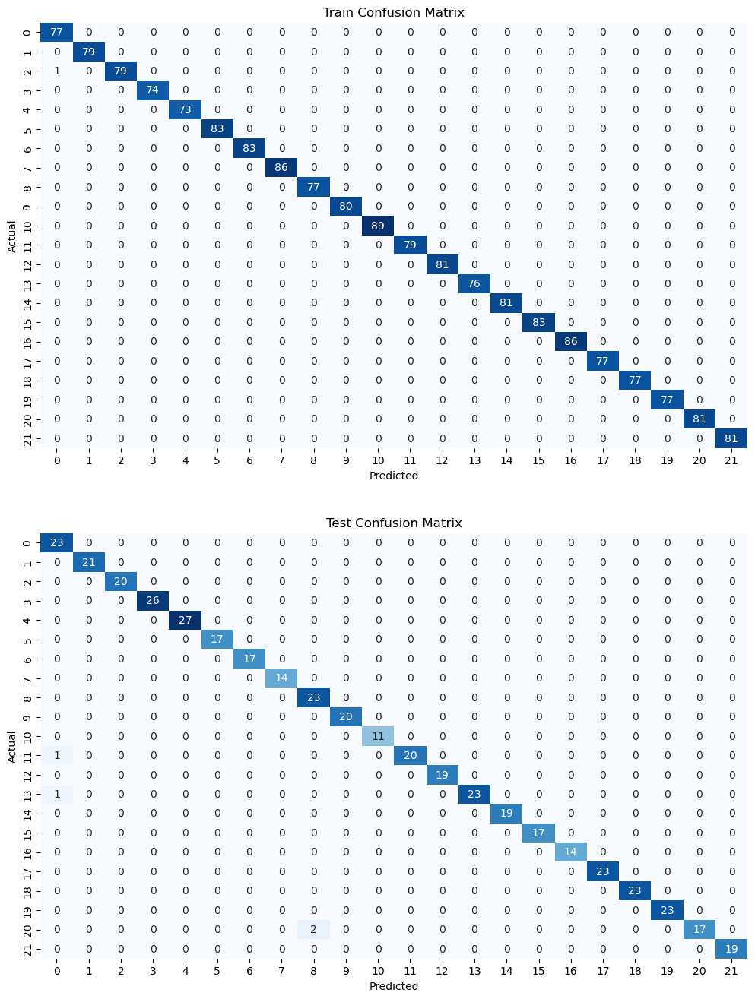

CPU times: total: 1.44 s
Wall time: 1.46 s


In [25]:
%%time
# RandomForestClassifier
warnings.filterwarnings('ignore')
ranfor=clasicalmodels(RandomForestClassifier(n_estimators=18,random_state=86),model_name='RFC')

KNeighborsClassifier(n_neighbors=6) :
Train Accuracy : 0.9801
Test  Accuracy : 0.9659
Train Precision: 0.9944
Test  Precision: 0.9800
Train Recall   : 0.9801
Test  Recall   : 0.9659
Train F1 Score : 0.9869
Test  F1 Score : 0.9708


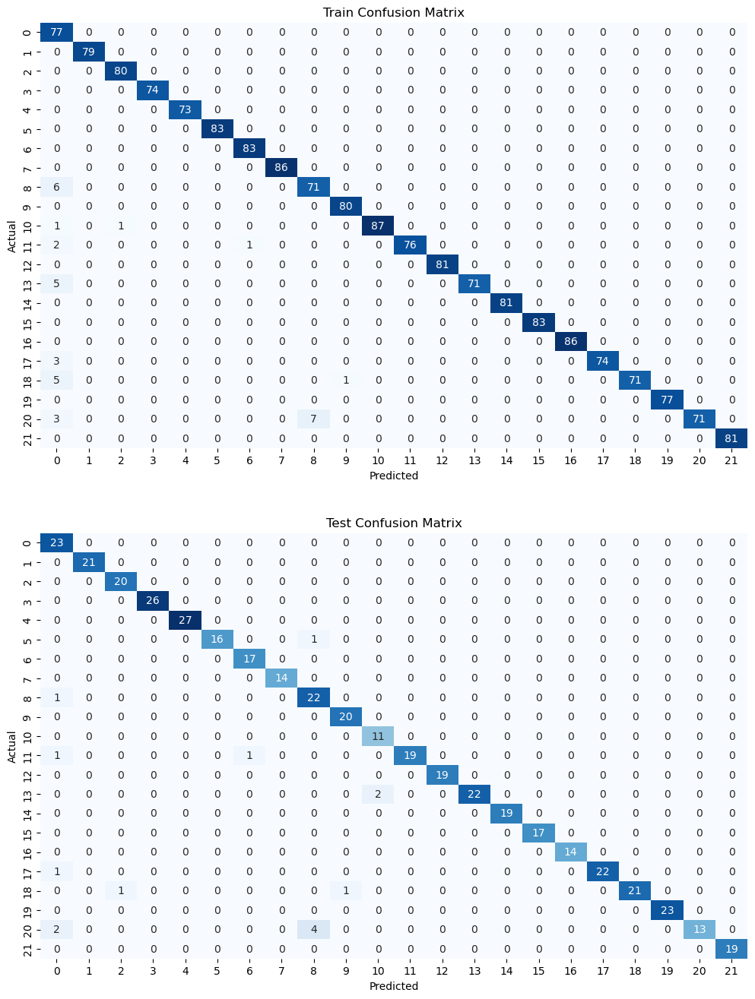

CPU times: total: 2.28 s
Wall time: 2.3 s


In [26]:
%%time
# KNeighborsClassifier
warnings.filterwarnings('ignore')
knc=clasicalmodels(KNeighborsClassifier(n_neighbors=6),model_name='KNC')
warnings.filterwarnings('ignore')

In [27]:
def clasicalmodels(model,pathname,model_name,xtrain=xtrain,ytrain=ytrain,xtest=xtest,ytest=ytest):
    model.fit(xtrain, ytrain)
    ypred_train = model.predict(xtrain)
    ypred_test = model.predict(xtest)
    print(model,':')
    
    tr_acc = accuracy_score(ytrain, ypred_train)
    te_acc = accuracy_score(ytest, ypred_test)
    tr_p = precision_score(ytrain, ypred_train, average="weighted")
    te_p = precision_score(ytest, ypred_test, average="weighted")
    tr_r = recall_score(ytrain, ypred_train, average="weighted")
    te_r = recall_score(ytest, ypred_test, average="weighted")
    tr_f = f1_score(ytrain, ypred_train, average="weighted")
    te_f = f1_score(ytest, ypred_test, average="weighted")
    
    print(f"Train Acc uracy : {tr_acc:.4f}")
    print(f"Test  Accuracy : {te_acc:.4f}")
    print(f"Train Precision: {tr_p:.4f}")
    print(f"Test  Precision: {te_p:.4f}")
    print(f"Train Recall   : {tr_r:.4f}")
    print(f"Test  Recall   : {te_r:.4f}")    
    print(f"Train F1 Score : {tr_f:.4f}")
    print(f"Test  F1 Score : {te_f:.4f}")

    model_results.loc[len(model_results)] = [model_name,tr_acc,te_acc,tr_p, te_p, tr_r, te_r, tr_f, te_f]


    fig, axes = plt.subplots(2, 1, figsize=(12, 16))
    sns.heatmap(confusion_matrix(np.argmax(ytrain, axis=1),np.argmax(ypred_train, axis=1)),annot=True,fmt='d',ax=axes[0],cmap="Blues",cbar=False )

    axes[0].set_title("Train Confusion Matrix")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("Actual")
    
    sns.heatmap(confusion_matrix(np.argmax(ytest, axis=1),np.argmax(ypred_test, axis=1)),annot=True,fmt='d',ax=axes[1],cmap="Blues",cbar=False )
    axes[1].set_title("Test Confusion Matrix")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("Actual")
    plt.show()
        
    from pathlib import Path
    root=Path("models")
    root.mkdir(exist_ok=True)
    path = root / f"{str(pathname)}.pkl"
    joblib.dump(model, path)

    return model
        

In [28]:
# for feature use

# final results

In [29]:
model_results

,Model,Train_Acc,Test_Acc,Train_Prec,Test_Prec,Train_Rec,Test_Rec,Train_F1,Test_F1
0,DTC,0.884091,0.861364,0.840763,0.821215,0.884091,0.861364,0.853166,0.829972
1,RFC,0.999432,0.990909,1.000000,0.995818,0.999432,0.990909,0.999714,0.993098
2,KNC,0.980114,0.965909,0.994390,0.979998,0.980114,0.965909,0.986901,0.970760


In [30]:
def evaluate_model(model, loader, device):
    model.eval()

    y_true, y_pred = [], []

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)

            preds = model(x).argmax(1)

            y_true.extend(y.cpu().tolist())
            y_pred.extend(preds.cpu().tolist())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    return {
        "acc": (y_true == y_pred).mean(),
        "precision": precision_score(y_true, y_pred, average="weighted"),
        "recall": recall_score(y_true, y_pred, average="weighted"),
        "f1": f1_score(y_true, y_pred, average="weighted"),
        "cm": confusion_matrix(y_true, y_pred)
    }

In [31]:
def plot_cm_and_store(model, train_loader, test_loader, device, model_results, name="FFN"):
    tr = evaluate_model(model, train_loader, device)
    te = evaluate_model(model, test_loader, device)

    print("Train Accuracy :", tr["acc"])
    print("Test  Accuracy :", te["acc"])
    print("Train Precision:", tr["precision"])
    print("Test  Precision:", te["precision"])
    print("Train Recall   :", tr["recall"])
    print("Test  Recall   :", te["recall"])
    print("Train F1-score :", tr["f1"])
    print("Test  F1-score :", te["f1"])

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    sns.heatmap(tr["cm"], annot=True, fmt="d", ax=ax[0], cbar=False)
    ax[0].set_title(f"Train Acc = {tr['acc']:.3f}")
    sns.heatmap(te["cm"], annot=True, fmt="d", ax=ax[1], cbar=False)
    ax[1].set_title(f"Test Acc = {te['acc']:.3f}")
    plt.tight_layout(); plt.show()

    model_results.loc[len(model_results)] = [
        name,
        tr["acc"], te["acc"],
        tr["precision"], te["precision"],
        tr["recall"], te["recall"],
        tr["f1"], te["f1"]
    ]


In [ ]:
#model_results = model_results.drop(index=9).reset_index(drop=True)

# final results

In [33]:
model_results

,Model,Train_Acc,Test_Acc,Train_Prec,Test_Prec,Train_Rec,Test_Rec,Train_F1,Test_F1
0,DTC,0.884091,0.861364,0.840763,0.821215,0.884091,0.861364,0.853166,0.829972
1,RFC,0.999432,0.990909,1.000000,0.995818,0.999432,0.990909,0.999714,0.993098
2,KNC,0.980114,0.965909,0.994390,0.979998,0.980114,0.965909,0.986901,0.970760


In [34]:
def plot_model_metrics1(df):
    metrics = ['Acc', 'Prec', 'Rec', 'F1']
    sns.set(style="whitegrid", font_scale=1.2)

    fig, axes = plt.subplots(2, 3, figsize=(32, 20))
    axes = axes.flatten()

    palette_train = ["#88ccee", "#44aa99"]  # soft cyan / turquoise
    palette_test  = ["#ddcc77", "#cc6677"]  # soft mustard / rose
    palette_summary = ["#fb9a99", "#e31a1c", "#fdbf6f"]  # pink / red / peach


    # 1-4
    for i, m in enumerate(metrics):
        df_long = df[['Model', f'Train_{m}', f'Test_{m}']].copy()
        df_long = df_long.melt('Model', var_name='Dataset', value_name='Score')
        df_long['Dataset'] = df_long['Dataset'].apply(lambda x: 'Train' if 'Train' in x else 'Test')

        sns.barplot(x='Model', y='Score', hue='Dataset', data=df_long,
                    palette=[palette_train[0], palette_test[0]], ax=axes[i])
        axes[i].set_title(f'{m} - Train vs Test', fontsize=16)
        axes[i].set_ylim(0, 1.05)
        axes[i].tick_params(axis='x', rotation=30)

    # 5
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Train_{m}'].max(),
            'Min': df[f'Train_{m}'].min(),
            'Avg': df[f'Train_{m}'].mean()
        })
    summary_train = pd.DataFrame(summary_list).melt(id_vars='Metric',
                                                    var_name='Stat', value_name='Score')

    sns.barplot(x='Metric', y='Score', hue='Stat', data=summary_train,
                palette=palette_summary, ax=axes[4])
    axes[4].set_title('Train Summary (Max / Min / Avg)', fontsize=16)
    axes[4].set_ylim(0, 1.05)
    for container in axes[4].containers:  # annotate only summary
        axes[4].bar_label(container, fmt="%.3f", padding=3)

    # 6
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Test_{m}'].max(),
            'Min': df[f'Test_{m}'].min(),
            'Avg': df[f'Test_{m}'].mean()
        })
    summary_test = pd.DataFrame(summary_list).melt(id_vars='Metric',
                                                   var_name='Stat', value_name='Score')

    sns.barplot(x='Metric', y='Score', hue='Stat', data=summary_test,
                palette=palette_summary, ax=axes[5])
    axes[5].set_title('Test Summary (Max / Min / Avg)', fontsize=16)
    axes[5].set_ylim(0, 1.05)
    for container in axes[5].containers:  # annotate only summary
        axes[5].bar_label(container, fmt="%.3f", padding=3)

    plt.tight_layout()
    plt.savefig("plot_model_metrics1.jpg", dpi=1000, bbox_inches="tight")
    plt.show()


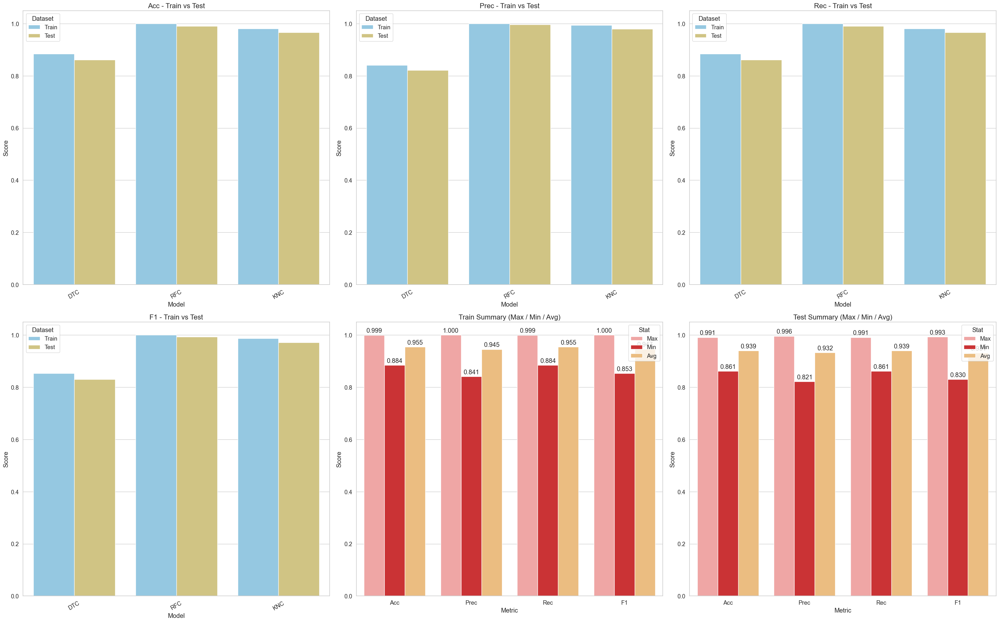

In [35]:
plot_model_metrics1(model_results)

In [36]:
def plot_model_metrics2(df):
    metrics = ['Acc', 'Prec', 'Rec', 'F1']
    sns.set(style="whitegrid", font_scale=1.2)

    palette_train = ["#88ccee", "#44aa99"]      # soft cyan / turquoise
    palette_test  = ["#ddcc77", "#cc6677"]      # soft mustard / rose
    palette_summary = ["#fb9a99", "#e31a1c", "#fdbf6f"]  # pink / red / peach

    # 1-4
    for m in metrics:
        df_long = df[['Model', f'Train_{m}', f'Test_{m}']].copy()
        df_long = df_long.melt('Model', var_name='Dataset', value_name='Score')
        df_long['Dataset'] = df_long['Dataset'].apply(lambda x: 'Train' if 'Train' in x else 'Test')

        plt.figure(figsize=(16, 8))
        sns.barplot(x='Model', y='Score', hue='Dataset', data=df_long,
                    palette=[palette_train[0], palette_test[0]])
        plt.title(f'{m} - Train vs Test', fontsize=18)
        plt.ylim(0, 1.05)
        plt.xticks(rotation=30)
        plt.tight_layout()
        plt.show()

    # 5
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Train_{m}'].max(),
            'Min': df[f'Train_{m}'].min(),
            'Avg': df[f'Train_{m}'].mean()
        })
    summary_train = pd.DataFrame(summary_list).melt(id_vars='Metric',
                                                    var_name='Stat', value_name='Score')

    plt.figure(figsize=(16, 8))
    sns.barplot(x='Metric', y='Score', hue='Stat', data=summary_train,
                palette=palette_summary)
    plt.title('Train Summary (Max / Min / Avg)', fontsize=18)
    plt.ylim(0, 1.05)
    for container in plt.gca().containers:
        plt.gca().bar_label(container, fmt="%.3f", padding=3)
    plt.tight_layout()
    plt.show()

    # 6
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Test_{m}'].max(),
            'Min': df[f'Test_{m}'].min(),
            'Avg': df[f'Test_{m}'].mean()
        })
    summary_test = pd.DataFrame(summary_list).melt(id_vars='Metric',
                                                   var_name='Stat', value_name='Score')

    plt.figure(figsize=(16, 8))
    sns.barplot(x='Metric', y='Score', hue='Stat', data=summary_test,
                palette=palette_summary)
    plt.title('Test Summary (Max / Min / Avg)', fontsize=18)
    plt.ylim(0, 1.05)
    for container in plt.gca().containers:
        plt.gca().bar_label(container, fmt="%.3f", padding=3)
    plt.tight_layout()
    plt.show()


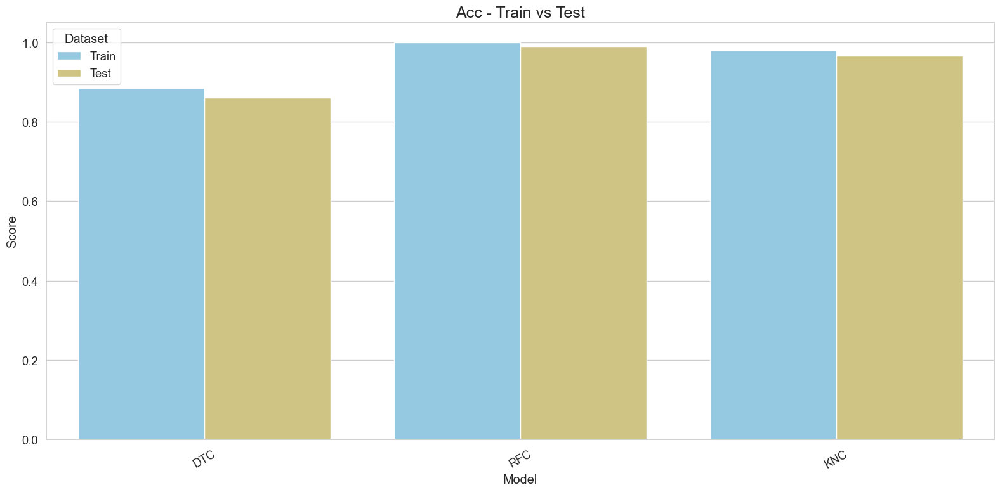

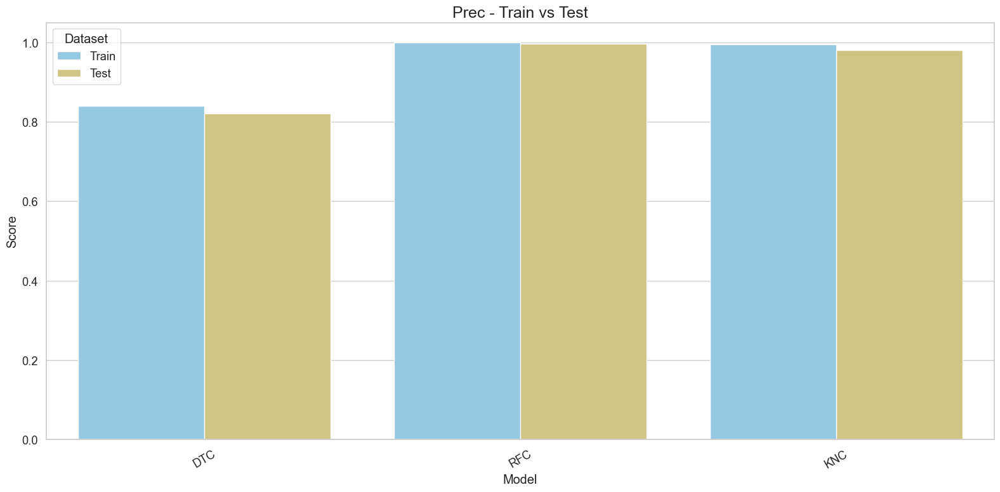

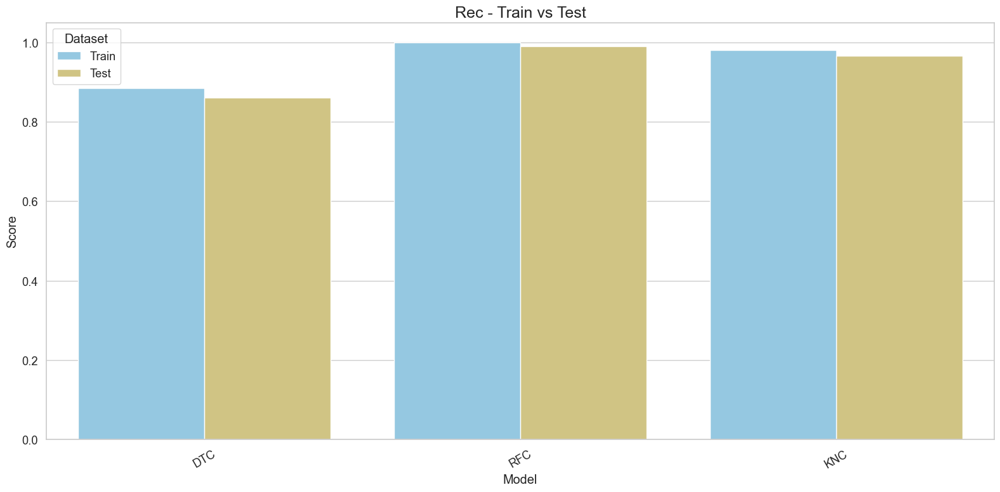

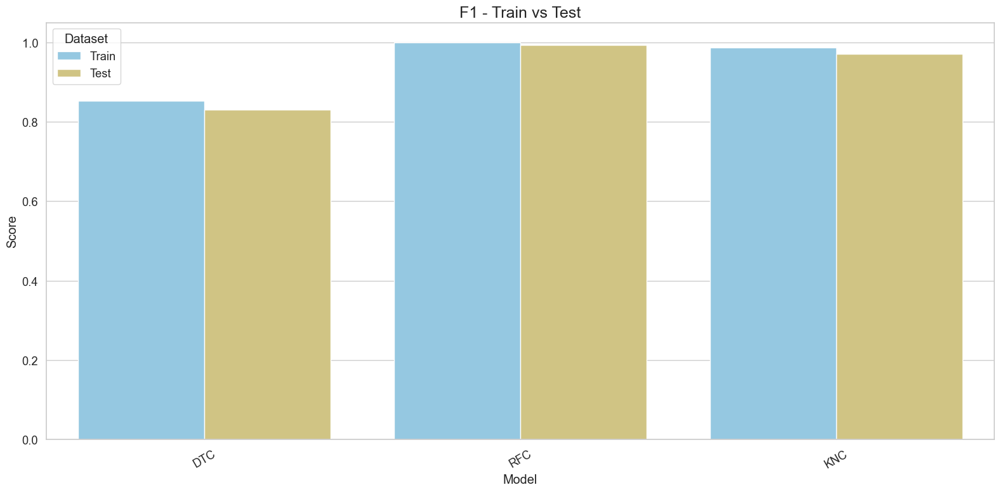

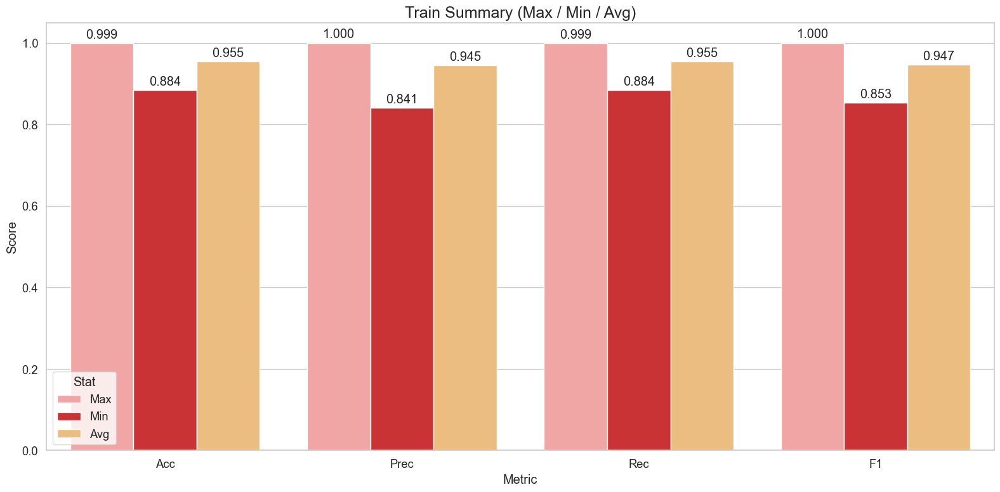

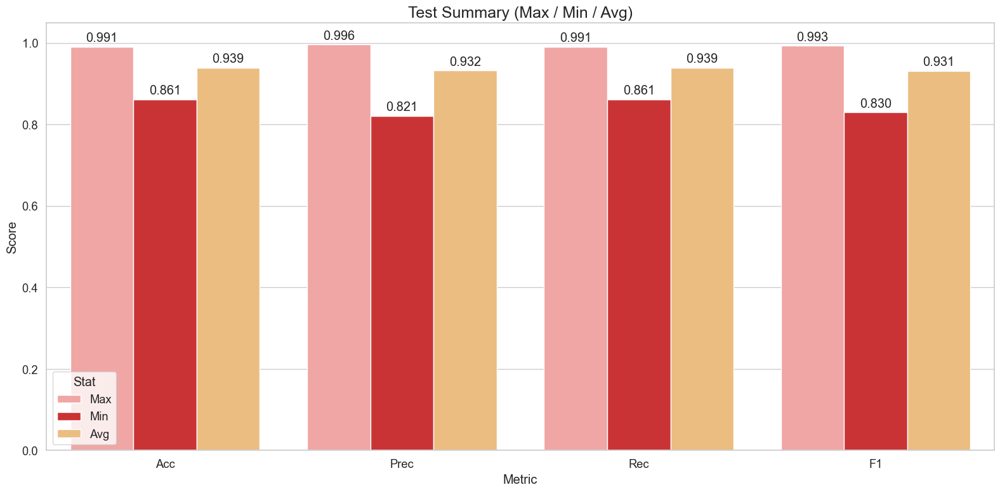

In [37]:
plot_model_metrics2(model_results)

In [38]:
def plot_model_metrics1(df):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    metrics = ['Acc', 'Prec', 'Rec', 'F1']
    sns.set(style="whitegrid", font_scale=1.2)

    fig, axes = plt.subplots(2, 3, figsize=(32, 20))
    axes = axes.flatten()

    palette_train = "#4DBBD5"
    palette_test  = "#E64B35"

    palette_summary = {
        "Max": "#3C5488",
        "Min": "#00A087",
        "Avg": "#F39B7F"
    }

    # -------- 1–4 METRIC PLOTS --------
    for i, m in enumerate(metrics):

        df_long = df[['Model', f'Train_{m}', f'Test_{m}']].copy()
        df_long = df_long.melt('Model', var_name='Dataset', value_name='Score')
        df_long['Dataset'] = df_long['Dataset'].apply(lambda x: 'Train' if 'Train' in x else 'Test')

        ax = axes[i]

        models = df_long['Model'].unique()
        x = np.arange(len(models))

        train_vals = df_long[df_long.Dataset=='Train']['Score'].values
        test_vals = df_long[df_long.Dataset=='Test']['Score'].values

        # lollipop stems
        ax.vlines(x-0.15, 0, train_vals, color=palette_train, lw=4, alpha=0.4)
        ax.vlines(x+0.15, 0, test_vals, color=palette_test, lw=4, alpha=0.4)

        # scatter heads
        ax.scatter(x-0.15, train_vals, s=250, color=palette_train, edgecolor='black', zorder=3, label="Train")
        ax.scatter(x+0.15, test_vals, s=250, color=palette_test, edgecolor='black', zorder=3, label="Test")

        ax.set_xticks(x)
        ax.set_xticklabels(models, rotation=30)

        ax.set_ylim(0,1.05)
        ax.set_title(f'{m} - Train vs Test', fontsize=18)

        ax.grid(True, linestyle='--', alpha=0.3)
        ax.legend()

    # -------- TRAIN SUMMARY --------
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Train_{m}'].max(),
            'Min': df[f'Train_{m}'].min(),
            'Avg': df[f'Train_{m}'].mean()
        })

    summary_train = pd.DataFrame(summary_list)

    ax = axes[4]

    x = np.arange(len(metrics))

    for stat in ['Max','Min','Avg']:
        vals = summary_train[stat].values
        ax.plot(x, vals, marker='o', markersize=12,
                linewidth=4,
                label=stat,
                color=palette_summary[stat])

        for i_val, v in enumerate(vals):
            ax.text(i_val, v+0.015, f"{v:.3f}", ha='center', fontsize=11)

    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.set_ylim(0,1.05)
    ax.set_title('Train Summary (Max / Min / Avg)', fontsize=18)
    ax.legend()

    ax.grid(True, linestyle='--', alpha=0.3)


    # -------- TEST SUMMARY --------
    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Test_{m}'].max(),
            'Min': df[f'Test_{m}'].min(),
            'Avg': df[f'Test_{m}'].mean()
        })

    summary_test = pd.DataFrame(summary_list)

    ax = axes[5]

    x = np.arange(len(metrics))

    for stat in ['Max','Min','Avg']:
        vals = summary_test[stat].values
        ax.plot(x, vals, marker='o', markersize=12,
                linewidth=4,
                label=stat,
                color=palette_summary[stat])

        for i_val, v in enumerate(vals):
            ax.text(i_val, v+0.015, f"{v:.3f}", ha='center', fontsize=11)

    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.set_ylim(0,1.05)
    ax.set_title('Test Summary (Max / Min / Avg)', fontsize=18)
    ax.legend()

    ax.grid(True, linestyle='--', alpha=0.3)

    plt.tight_layout()
    plt.savefig("plot_model_metrics3.jpg", dpi=1000, bbox_inches="tight")
    plt.show()

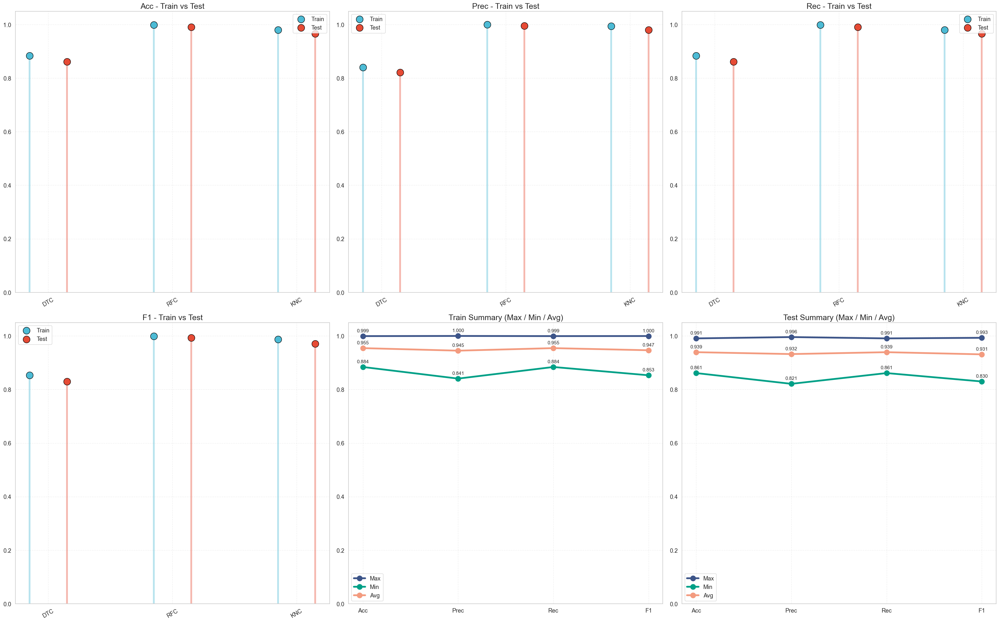

In [39]:
plot_model_metrics1(model_results)

In [40]:
def plot_model_metrics1(df):

    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    metrics = ['Acc', 'Prec', 'Rec', 'F1']
    sns.set(style="whitegrid", font_scale=1.2)

    fig = plt.figure(figsize=(32,20))
    axes = [plt.subplot(2,3,i+1, projection='polar') if i<4 else plt.subplot(2,3,i+1) for i in range(6)]

    train_color = "#00c2ff"
    test_color = "#ff5e78"

    glow_train = "#a6ecff"
    glow_test = "#ffc1cc"

    # -------------------------
    # 1–4 RADIAL MODEL PLOTS
    # -------------------------

    for i, m in enumerate(metrics):

        ax = axes[i]

        train_vals = df[f'Train_{m}'].values
        test_vals = df[f'Test_{m}'].values

        models = df['Model'].values
        angles = np.linspace(0,2*np.pi,len(models),endpoint=False)

        train_vals = np.append(train_vals,train_vals[0])
        test_vals = np.append(test_vals,test_vals[0])
        angles = np.append(angles,angles[0])

        # glow layer
        ax.plot(angles,train_vals,color=glow_train,linewidth=12,alpha=0.25)
        ax.plot(angles,test_vals,color=glow_test,linewidth=12,alpha=0.25)

        # main layer
        ax.plot(angles,train_vals,color=train_color,linewidth=3,label="Train")
        ax.plot(angles,test_vals,color=test_color,linewidth=3,label="Test")

        ax.scatter(angles,train_vals,s=180,color=train_color,edgecolor="black",zorder=3)
        ax.scatter(angles,test_vals,s=180,color=test_color,edgecolor="black",zorder=3)

        ax.set_ylim(0,1.05)
        ax.set_title(f"{m} Comparison",fontsize=18,pad=20)

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(models,fontsize=11)

        ax.legend(loc="upper right")

    # -------------------------
    # TRAIN SUMMARY DONUT
    # -------------------------

    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Train_{m}'].max(),
            'Min': df[f'Train_{m}'].min(),
            'Avg': df[f'Train_{m}'].mean()
        })

    summary_train = pd.DataFrame(summary_list)

    ax = axes[4]

    sizes = [
        summary_train['Max'].mean(),
        summary_train['Min'].mean(),
        summary_train['Avg'].mean()
    ]

    labels = ["Max","Min","Avg"]

    colors = ["#ff6b6b","#4ecdc4","#ffe66d"]

    wedges,texts,autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct='%0.3f',
        startangle=90,
        colors=colors,
        pctdistance=0.8,
        wedgeprops=dict(width=0.45)
    )

    ax.set_title("Train Summary (Max / Min / Avg)",fontsize=18)


    # -------------------------
    # TEST SUMMARY DONUT
    # -------------------------

    summary_list = []
    for m in metrics:
        summary_list.append({
            'Metric': m,
            'Max': df[f'Test_{m}'].max(),
            'Min': df[f'Test_{m}'].min(),
            'Avg': df[f'Test_{m}'].mean()
        })

    summary_test = pd.DataFrame(summary_list)

    ax = axes[5]

    sizes = [
        summary_test['Max'].mean(),
        summary_test['Min'].mean(),
        summary_test['Avg'].mean()
    ]

    labels = ["Max","Min","Avg"]

    colors = ["#ff6b6b","#4ecdc4","#ffe66d"]

    wedges,texts,autotexts = ax.pie(
        sizes,
        labels=labels,
        autopct='%0.3f',
        startangle=90,
        colors=colors,
        pctdistance=0.8,
        wedgeprops=dict(width=0.45)
    )

    ax.set_title("Test Summary (Max / Min / Avg)",fontsize=18)

    plt.tight_layout()
    plt.savefig("plot_model_metrics2.jpg",dpi=1000,bbox_inches="tight")
    plt.show()

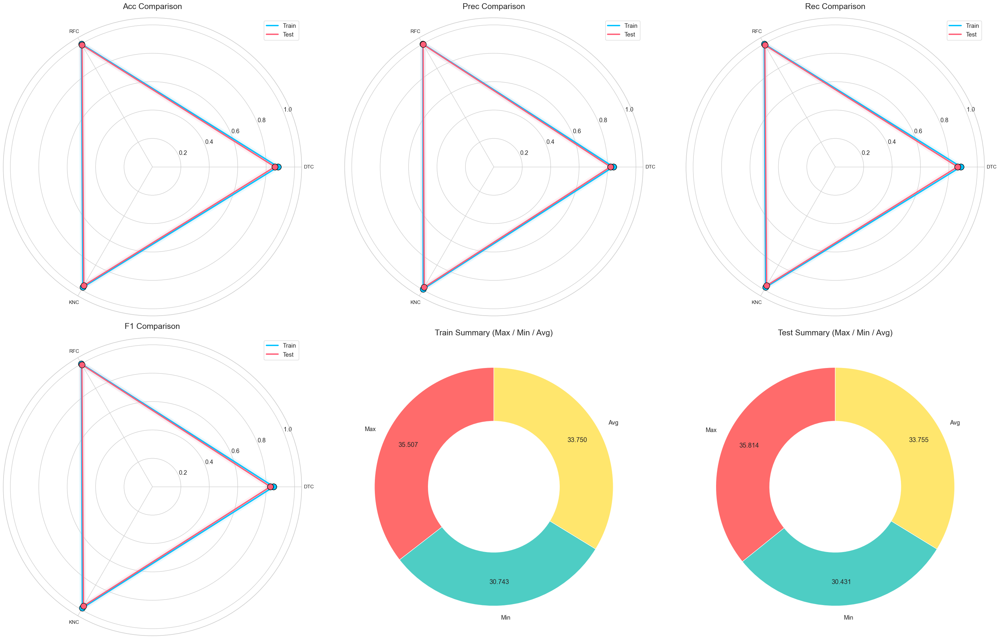

In [41]:
plot_model_metrics1(model_results)

In [42]:
def plot_model_metrics1(df):

    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    metrics = ['Acc','Prec','Rec','F1']
    sns.set(style="whitegrid", font_scale=1.2)

    fig, axes = plt.subplots(2,3,figsize=(32,20))
    ax1,ax2,ax3,ax4,ax5,ax6 = axes.flatten()

    models = df['Model'].values
    x = np.arange(len(models))

    # ------------------------------------------------
    # 1 RADAR CHART (Average metric comparison)
    # ------------------------------------------------

    ax1.remove()
    ax1 = fig.add_subplot(2,3,1, projection='polar')

    train_avg = [df[f'Train_{m}'].mean() for m in metrics]
    test_avg  = [df[f'Test_{m}'].mean() for m in metrics]

    angles = np.linspace(0,2*np.pi,len(metrics),endpoint=False)

    train_avg += train_avg[:1]
    test_avg += test_avg[:1]
    angles = np.append(angles,angles[0])

    ax1.plot(angles,train_avg,linewidth=3,label="Train",color="#00c2ff")
    ax1.fill(angles,train_avg,alpha=0.25,color="#00c2ff")

    ax1.plot(angles,test_avg,linewidth=3,label="Test",color="#ff6b6b")
    ax1.fill(angles,test_avg,alpha=0.25,color="#ff6b6b")

    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(metrics)
    ax1.set_ylim(0,1)
    ax1.set_title("Metric Radar Comparison",fontsize=18)
    ax1.legend()


    # ------------------------------------------------
    # 2 BUBBLE SCATTER
    # ------------------------------------------------

    train_acc = df['Train_Acc']
    test_acc = df['Test_Acc']

    sizes = (train_acc + test_acc)*800

    ax2.scatter(train_acc,test_acc,
                s=sizes,
                c=train_acc,
                cmap="viridis",
                alpha=0.7,
                edgecolors="black")

    for i,m in enumerate(models):
        ax2.text(train_acc[i],test_acc[i],m,ha='center',va='center')

    ax2.set_xlabel("Train Accuracy")
    ax2.set_ylabel("Test Accuracy")
    ax2.set_title("Train vs Test Accuracy Bubble Plot",fontsize=18)


    # ------------------------------------------------
    # 3 HEATMAP
    # ------------------------------------------------

    heat_df = df.set_index("Model")[
        [f'Train_{m}' for m in metrics] +
        [f'Test_{m}' for m in metrics]
    ]

    sns.heatmap(
        heat_df,
        cmap="coolwarm",
        annot=True,
        fmt=".3f",
        linewidths=0.5,
        ax=ax3
    )

    ax3.set_title("Model Performance Heatmap",fontsize=18)


    # ------------------------------------------------
    # 4 LOLLIPOP PLOT
    # ------------------------------------------------

    metric = "F1"

    train_vals = df[f'Train_{metric}']
    test_vals = df[f'Test_{metric}']

    ax4.vlines(x-0.1,0,train_vals,color="#00c2ff",lw=5,alpha=0.6)
    ax4.vlines(x+0.1,0,test_vals,color="#ff6b6b",lw=5,alpha=0.6)

    ax4.scatter(x-0.1,train_vals,s=200,color="#00c2ff",edgecolor="black",label="Train")
    ax4.scatter(x+0.1,test_vals,s=200,color="#ff6b6b",edgecolor="black",label="Test")

    ax4.set_xticks(x)
    ax4.set_xticklabels(models,rotation=30)
    ax4.set_ylim(0,1.05)

    ax4.set_title("F1 Score Comparison",fontsize=18)
    ax4.legend()


    # ------------------------------------------------
    # 5 DONUT CHART (TRAIN SUMMARY)
    # ------------------------------------------------

    train_stats = [
        max(df['Train_Acc']),
        min(df['Train_Acc']),
        df['Train_Acc'].mean()
    ]

    labels = ["Max","Min","Avg"]

    wedges,_,_ = ax5.pie(
        train_stats,
        labels=labels,
        autopct='%0.3f',
        startangle=90,
        colors=["#ff6b6b","#4ecdc4","#ffe66d"],
        wedgeprops=dict(width=0.45)
    )

    ax5.set_title("Train Accuracy Summary",fontsize=18)


    # ------------------------------------------------
    # 6 RADIAL BAR CHART (TEST SUMMARY)
    # ------------------------------------------------

    ax6.remove()
    ax6 = fig.add_subplot(2,3,6, projection='polar')

    test_avg = [df[f'Test_{m}'].mean() for m in metrics]

    angles = np.linspace(0,2*np.pi,len(metrics),endpoint=False)

    bars = ax6.bar(
        angles,
        test_avg,
        width=0.4,
        color=plt.cm.plasma(test_avg),
        alpha=0.85
    )

    ax6.set_xticks(angles)
    ax6.set_xticklabels(metrics)

    ax6.set_ylim(0,1)

    ax6.set_title("Average Test Metrics Radial Bars",fontsize=18)

    plt.tight_layout()
    plt.savefig("plot_model_metrics4.jpg", dpi=1000, bbox_inches="tight")
    plt.show()

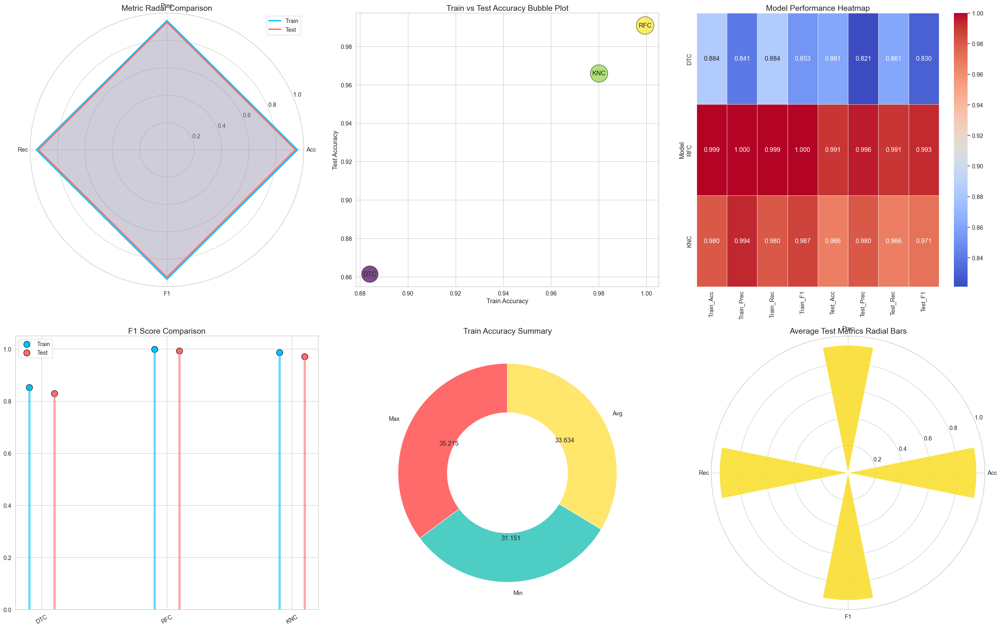

In [43]:
plot_model_metrics1(model_results)

In [44]:
def plot_model_metrics1(df):

    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    metrics = ['Acc','Prec','Rec','F1']

    sns.set_theme(style="whitegrid")

    fig, axes = plt.subplots(2,3,figsize=(32,20))
    ax1,ax2,ax3,ax4,ax5,ax6 = axes.flatten()

    # ------------------------------------------------
    # 1 Accuracy Train vs Test
    # ------------------------------------------------

    df_acc = df[['Model','Train_Acc','Test_Acc']].melt(
        id_vars="Model",
        var_name="Dataset",
        value_name="Score"
    )

    sns.barplot(
        data=df_acc,
        x="Model",
        y="Score",
        hue="Dataset",
        palette=["#4DBBD5","#E64B35"],
        ax=ax1
    )

    ax1.set_title("Accuracy: Train vs Test",fontsize=18)
    ax1.set_ylim(0,1.05)
    ax1.tick_params(axis='x',rotation=30)

    # ------------------------------------------------
    # 2 Precision Recall F1 Trend
    # ------------------------------------------------

    for m,color in zip(['Prec','Rec','F1'],["#00A087","#3C5488","#F39B7F"]):

        ax2.plot(
            df["Model"],
            df[f"Test_{m}"],
            marker="o",
            linewidth=3,
            label=m,
            color=color
        )

    ax2.set_ylim(0,1.05)
    ax2.set_title("Test Metric Trends Across Models",fontsize=18)
    ax2.tick_params(axis='x',rotation=30)
    ax2.legend()

    # ------------------------------------------------
    # 3 Overfitting Gap
    # ------------------------------------------------

    gap = df['Train_Acc'] - df['Test_Acc']

    colors = ["#2ECC71" if g<0.02 else "#E74C3C" for g in gap]

    ax3.bar(df["Model"],gap,color=colors)

    ax3.axhline(0,color="black",linewidth=1)

    ax3.set_title("Train-Test Accuracy Gap (Overfitting Indicator)",fontsize=18)
    ax3.tick_params(axis='x',rotation=30)

    # ------------------------------------------------
    # 4 Metric Distribution
    # ------------------------------------------------

    dist_df = df[[f'Train_{m}' for m in metrics]].copy()

    dist_df.columns = metrics

    sns.boxplot(
        data=dist_df,
        palette="Set2",
        ax=ax4
    )

    ax4.set_ylim(0,1.05)
    ax4.set_title("Distribution of Train Metrics",fontsize=18)

    # ------------------------------------------------
    # 5 Train Summary
    # ------------------------------------------------

    train_stats = pd.DataFrame({
        "Metric":metrics,
        "Max":[df[f"Train_{m}"].max() for m in metrics],
        "Min":[df[f"Train_{m}"].min() for m in metrics],
        "Avg":[df[f"Train_{m}"].mean() for m in metrics]
    }).melt(id_vars="Metric",var_name="Stat",value_name="Score")

    sns.barplot(
        data=train_stats,
        x="Metric",
        y="Score",
        hue="Stat",
        palette=["#E41A1C","#377EB8","#4DAF4A"],
        ax=ax5
    )

    ax5.set_ylim(0,1.05)
    ax5.set_title("Train Metric Summary",fontsize=18)

    for container in ax5.containers:
        ax5.bar_label(container,fmt="%.3f")

    # ------------------------------------------------
    # 6 Test Summary
    # ------------------------------------------------

    test_stats = pd.DataFrame({
        "Metric":metrics,
        "Max":[df[f"Test_{m}"].max() for m in metrics],
        "Min":[df[f"Test_{m}"].min() for m in metrics],
        "Avg":[df[f"Test_{m}"].mean() for m in metrics]
    }).melt(id_vars="Metric",var_name="Stat",value_name="Score")

    sns.barplot(
        data=test_stats,
        x="Metric",
        y="Score",
        hue="Stat",
        palette=["#E41A1C","#377EB8","#4DAF4A"],
        ax=ax6
    )

    ax6.set_ylim(0,1.05)
    ax6.set_title("Test Metric Summary",fontsize=18)

    for container in ax6.containers:
        ax6.bar_label(container,fmt="%.3f")

    plt.tight_layout()
    plt.savefig("plot_model_metrics6.jpg",dpi=1000,bbox_inches="tight")
    plt.show()

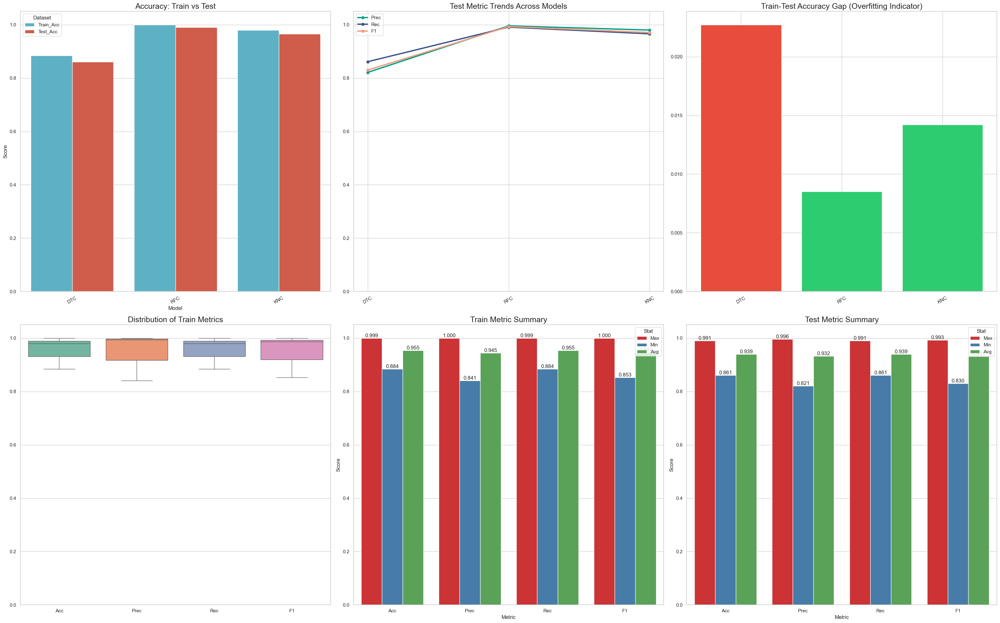

In [45]:
plot_model_metrics1(model_results)

In [46]:
def plot_model_metrics1(df):

    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    metrics = ['Acc','Prec','Rec','F1']

    sns.set_theme(style="whitegrid", font_scale=1.3)

    fig, axes = plt.subplots(2,3,figsize=(32,20))
    ax1,ax2,ax3,ax4,ax5,ax6 = axes.flatten()

    models = df["Model"]

    # ------------------------------------------------
    # 1 Train vs Test Accuracy
    # ------------------------------------------------

    df_acc = df[['Model','Train_Acc','Test_Acc']].melt(
        id_vars="Model",
        var_name="Dataset",
        value_name="Score"
    )

    sns.barplot(
        data=df_acc,
        x="Model",
        y="Score",
        hue="Dataset",
        palette=["#4DBBD5","#E64B35"],
        ax=ax1
    )

    ax1.set_title("Accuracy: Train vs Test",fontsize=20)
    ax1.set_ylim(0,1.05)
    ax1.tick_params(axis='x',rotation=30)

    # ------------------------------------------------
    # 2 Precision Recall F1 trend
    # ------------------------------------------------

    for m,c in zip(["Prec","Rec","F1"],["#00A087","#3C5488","#F39B7F"]):

        ax2.plot(
            models,
            df[f"Test_{m}"],
            marker="o",
            linewidth=4,
            markersize=10,
            label=m,
            color=c
        )

    ax2.set_ylim(0,1.05)
    ax2.set_title("Test Metric Comparison",fontsize=20)
    ax2.legend()
    ax2.tick_params(axis='x',rotation=30)

    # ------------------------------------------------
    # 3 Overfitting gap
    # ------------------------------------------------

    gap = df["Train_Acc"] - df["Test_Acc"]

    colors = ["#2ECC71" if g<0.02 else "#E74C3C" for g in gap]

    ax3.bar(models,gap,color=colors)

    ax3.axhline(0,color="black",linewidth=1)

    ax3.set_title("Train-Test Gap (Overfitting)",fontsize=20)
    ax3.tick_params(axis='x',rotation=30)

    # ------------------------------------------------
    # 4 Heatmap
    # ------------------------------------------------

    heat = df.set_index("Model")[
        [f'Train_{m}' for m in metrics] +
        [f'Test_{m}' for m in metrics]
    ]

    sns.heatmap(
        heat,
        cmap="viridis",
        annot=True,
        fmt=".3f",
        linewidths=0.6,
        ax=ax4
    )

    ax4.set_title("Model Performance Heatmap",fontsize=20)

    # ------------------------------------------------
    # 5 Train summary
    # ------------------------------------------------

    train_stats = pd.DataFrame({
        "Metric":metrics,
        "Max":[df[f"Train_{m}"].max() for m in metrics],
        "Min":[df[f"Train_{m}"].min() for m in metrics],
        "Avg":[df[f"Train_{m}"].mean() for m in metrics]
    }).melt(id_vars="Metric",var_name="Stat",value_name="Score")

    sns.barplot(
        data=train_stats,
        x="Metric",
        y="Score",
        hue="Stat",
        palette="Set2",
        ax=ax5
    )

    ax5.set_ylim(0,1.05)
    ax5.set_title("Train Summary",fontsize=20)

    for c in ax5.containers:
        ax5.bar_label(c,fmt="%.3f")

    # ------------------------------------------------
    # 6 Test summary
    # ------------------------------------------------

    test_stats = pd.DataFrame({
        "Metric":metrics,
        "Max":[df[f"Test_{m}"].max() for m in metrics],
        "Min":[df[f"Test_{m}"].min() for m in metrics],
        "Avg":[df[f"Test_{m}"].mean() for m in metrics]
    }).melt(id_vars="Metric",var_name="Stat",value_name="Score")

    sns.barplot(
        data=test_stats,
        x="Metric",
        y="Score",
        hue="Stat",
        palette="Set2",
        ax=ax6
    )

    ax6.set_ylim(0,1.05)
    ax6.set_title("Test Summary",fontsize=20)

    for c in ax6.containers:
        ax6.bar_label(c,fmt="%.3f")

    plt.tight_layout()
    plt.savefig("plot_model_metrics6.jpg",dpi=1000,bbox_inches="tight")
    plt.show()

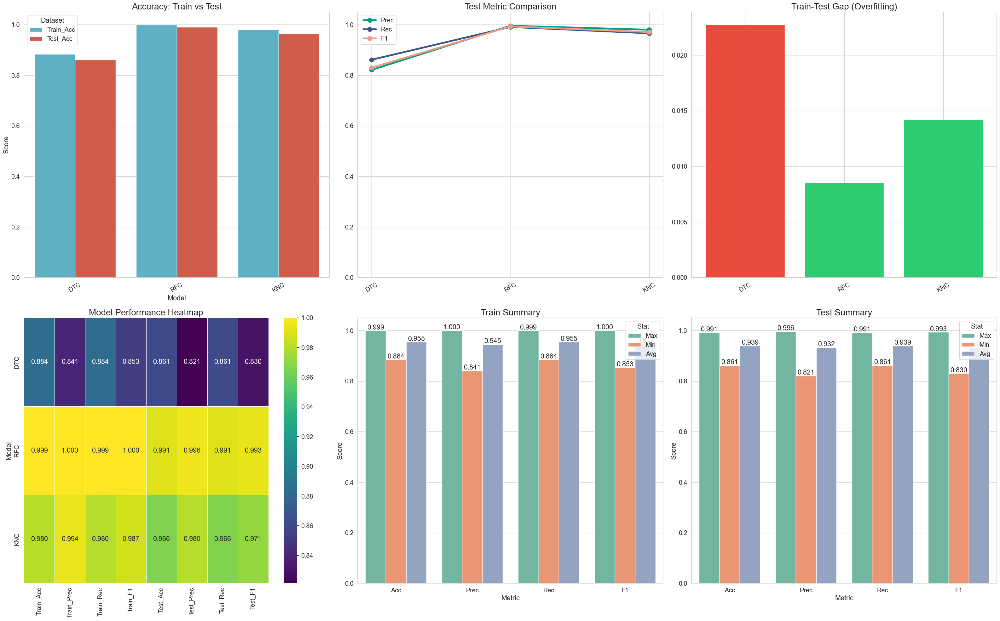

In [47]:
plot_model_metrics1(model_results)